<a href="https://colab.research.google.com/github/abhay-max/Machine_Learning/blob/master/Project_2_Music_Genre.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Problem Statement
Music Genre Identification Download data from here : https://www.dropbox.com/s/4jw31k5mlzcmgis/genres.tar.gz

Goal : Given audio files for songs , identify which genre they fall in

Suggested Guidelines :

You'll have to prepare and maintain your own version of train and validation from the full data given

Major challenge here is to create features from audio files which can then be passed to your choice of deep learning algorithm

In [1]:
!wget https://www.dropbox.com/s/4jw31k5mlzcmgis/genres.tar.gz

--2020-01-28 07:25:39--  https://www.dropbox.com/s/4jw31k5mlzcmgis/genres.tar.gz
Resolving www.dropbox.com (www.dropbox.com)... 162.125.8.1, 2620:100:6018:1::a27d:301
Connecting to www.dropbox.com (www.dropbox.com)|162.125.8.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/4jw31k5mlzcmgis/genres.tar.gz [following]
--2020-01-28 07:25:40--  https://www.dropbox.com/s/raw/4jw31k5mlzcmgis/genres.tar.gz
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc84af78da810e3dd651319a3200.dl.dropboxusercontent.com/cd/0/inline/AxDMNGLRiKMQLficT4e2WWH3Ti8fjNDTU6Vgh1j2JXfzc44Ow0nHj0hQSx9TxWMQ9wafQSEwxD_9jf3mvO7Vj_nkk1gzH9MupsxPggV_p1Z8jQ/file# [following]
--2020-01-28 07:25:40--  https://uc84af78da810e3dd651319a3200.dl.dropboxusercontent.com/cd/0/inline/AxDMNGLRiKMQLficT4e2WWH3Ti8fjNDTU6Vgh1j2JXfzc44Ow0nHj0hQSx9TxWMQ9wafQSEwxD_9jf3mvO7Vj_nkk1gzH9MupsxPggV_p1Z8jQ/file
Resolving uc84af

In [0]:
import tarfile
tar = tarfile.open('/content/genres.tar.gz')
tar.extractall("Genres_Extract")
tar.close()



We have librose package to extract features and analysing of audio signals.
To play audio in jupyter directly we have 'pyAudio' package.

Loading an audio

In [3]:
import librosa
audio_path ='/content/Genres_Extract/genres/blues/blues.00000.au' # this is only single audio file

x, sr = librosa.load(audio_path) #.load loads an audio file and decodes it into a 1-dimensional array which is a time series x
                                  # sr is a sampling rate of x

print(type(x),x.shape)
print(type(sr),sr)


<class 'numpy.ndarray'> (661794,)
<class 'int'> 22050


.load loads an audio file and decodes it into a 1-dimensional array which is a time series x , and sr is a sampling rate of x . Default sris 22kHz. We can override the 'sr' by 44100. this value is taken from tha below blog

Refrence = https://towardsdatascience.com/extract-features-of-music-75a3f9bc265d

In [4]:
librosa.load(audio_path,sr=44100)


(array([ 0.00735559,  0.01335777,  0.01657013, ..., -0.07286715,
        -0.0628456 , -0.03154328], dtype=float32), 44100)

We can disable sampling by using sr= 'None

In [5]:
librosa.load(audio_path,sr=None)

(array([ 0.00732422,  0.01660156,  0.00762939, ..., -0.05560303,
        -0.06106567, -0.06417847], dtype=float32), 22050)

IPython.display allow us to play audio on jupyter notebook directly. It has a very simple interface with some basic buttons.

Playing an audio

Audio can also accept a NumPy array. Let's synthesize a pure tone at 440 Hz:

In [8]:
import numpy
sr = 44100 # sample rate
T = 2.0 # Time in second
t = numpy.linspace(0, T, int(T*sr),endpoint=False)
x = 0.5*numpy.sin(2*numpy.pi*440*t)                # pure sine wave at 440 Hz

ipd.Audio(x, rate=sr)

In [9]:
import IPython.display as ipd

x, sr = librosa.load('/content/Genres_Extract/genres/blues/blues.00000.au')
print(x.shape, sr)
ipd.Audio(x, rate=sr)

(661794,) 22050


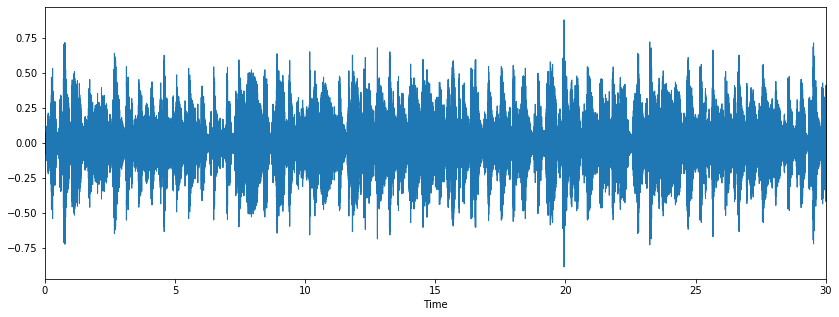

In [10]:
#display waveform plot by using librosa.display.waveplot between
# amplitude vs time where the first axis is an amplitude and second axis is time
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

In [0]:
# x, sr = librosa.load('/content/Genres_Extract/genres/blues/blues.00001.au')
# print(x.shape, sr)

In [0]:
# ipd.Audio(x, rate=sr)

librosa.feature.rmse returns the root-mean-square (RMS) energy for each frame of audio. We will compute the RMS energy as well as its first-order difference.

In [0]:
hop_length = 512
frame_length = 1024
rmse = librosa.feature.rmse(x, frame_length=frame_length, hop_length=hop_length).flatten()
rmse_diff = numpy.zeros_like(rmse)
rmse_diff[1:] = numpy.diff(rmse)

In [12]:
rmse

array([0.02762773, 0.02698374, 0.04829369, ..., 0.10597231, 0.14040591,
       0.15937394], dtype=float32)

In [13]:
rmse_diff

array([ 0.        , -0.00064399,  0.02130994, ..., -0.03472663,
        0.0344336 ,  0.01896803], dtype=float32)

In [14]:
rmse_diff[1:]

array([-0.00064399,  0.02130994,  0.01670285, ..., -0.03472663,
        0.0344336 ,  0.01896803], dtype=float32)

In [15]:
print(rmse.shape)
print(rmse_diff.shape)

(1293,)
(1293,)


To obtain an energy novelty function, we perform half-wave rectification (FMP, p. 307) on rmse_diff, i.e. any negative values are set to zero. Equivalently, we can apply the function  max(0,x) :

In [0]:
energy_novelty = numpy.max([numpy.zeros_like(rmse_diff), rmse_diff], axis=0)

Plot all three functions together:

In [0]:
frames = numpy.arange(len(rmse))
t = librosa.frames_to_time(frames, sr=sr)

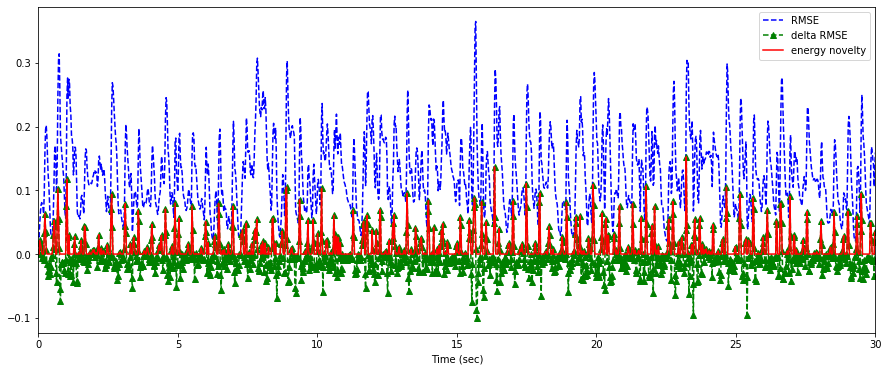

In [18]:
plt.figure(figsize=(15, 6))
plt.plot(t, rmse, 'b--', t, rmse_diff, 'g--^', t, energy_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('RMSE', 'delta RMSE', 'energy novelty')) 

Spectogram


A spectrogram is a visual representation of the spectrum of frequencies of sound or other signals as they vary with time. It’s a representation of frequencies changing with respect to time for given music signals.

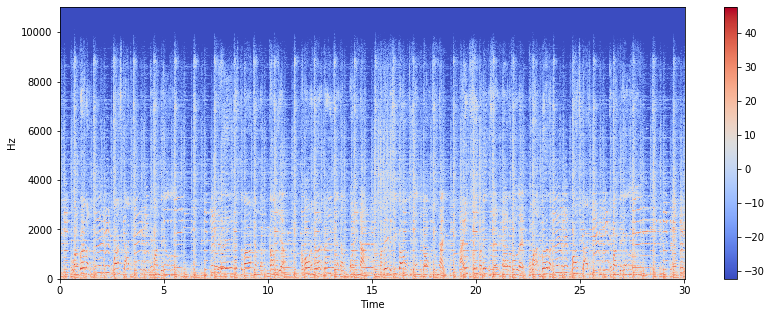

In [19]:
#display Spectrogram
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz') 
#If to pring log of frequencies  
#librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()


Zooming in:




Here we will zoom or print spectrum for 200 array columns only.

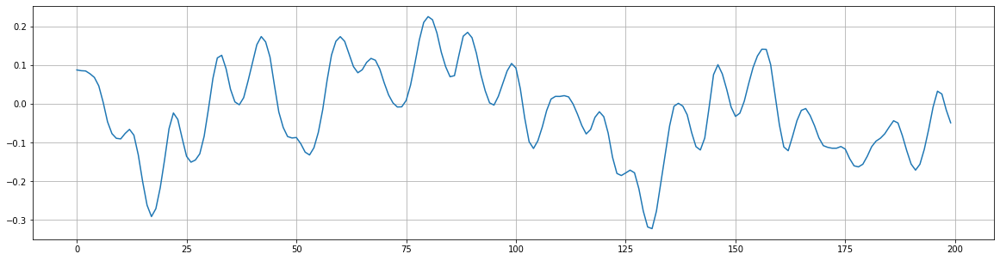

In [20]:
n0 = 8000
n1 = 8200
plt.figure(figsize=(20, 5))
plt.plot(x[n0:n1])
plt.grid()

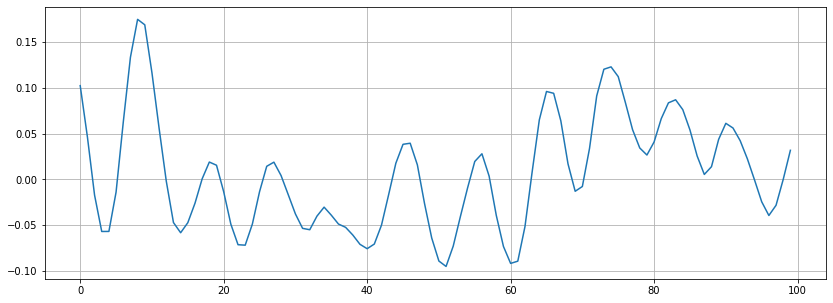

In [21]:
# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])
plt.grid()

We can also calculate zero crossings using a given code:

In [22]:
  # for 200 array spectrum
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))

16


**Spectral** **Centroid** 

It indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound. If the frequencies in music are same throughout then spectral centroid would be around a centre and if there are high frequencies at the end of sound then the centroid would be towards its end.

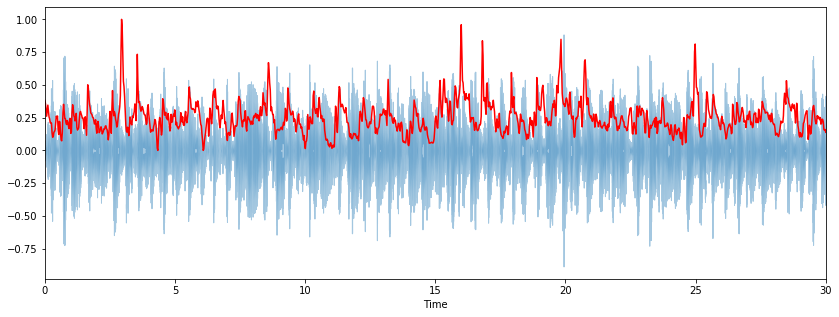

In [23]:
#spectral centroid -- centre of mass -- weighted mean of the frequencies present in the sound
import sklearn
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

#Plotting the Spectral Centroid along the waveform
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr, alpha=0.4)

plt.plot(t, normalize(spectral_centroids), color='r')

Spectral Rolloff



Spectral rolloff is the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.

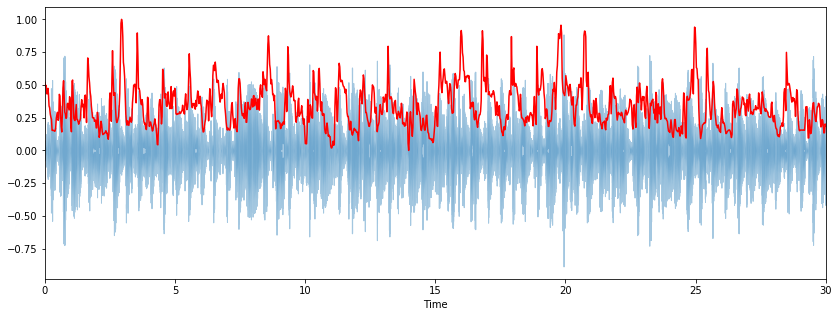

In [24]:
spectral_rolloff = librosa.feature.spectral_rolloff(x, sr=sr)[0]
plt.figure(figsize=(14,5))
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

MFCC — Mel-Frequency Cepstral Coefficients
This feature is one of the most important method to extract a feature of an audio signal and is used majorly whenever working on audio signals. The mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope.

(20, 1293)


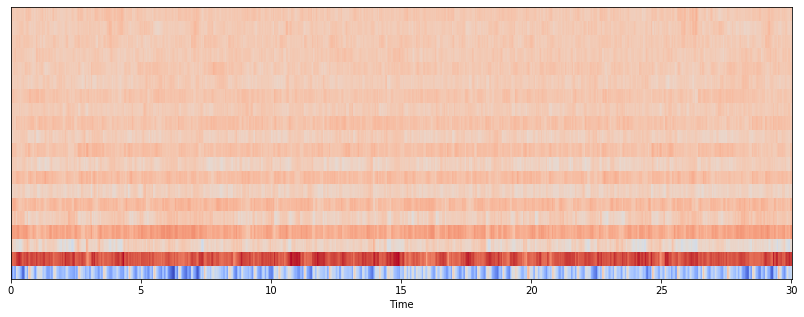

In [25]:
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)
#Displaying  the MFCCs:
plt.figure(figsize=(14,5))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

In [26]:
import librosa
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import csv
# Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler

#Keras
import keras
from keras.layers import LSTM, GRU, Activation, Dense,Dropout, Flatten,Input, Embedding, BatchNormalization
from keras.models import Model, Sequential
from keras import models
from keras import layers
from keras import backend as k

Using TensorFlow backend.


In [27]:
pip install --ignore-installed --upgrade https://storage.googleapis.com/tensorflow/mac/cpu/tensorflow-1.6.0-py3-none-any.whl

     |████████████████████████████████| 43.2MB 72kB/s 
     |████████████████████████████████| 112kB 9.5MB/s 
     |████████████████████████████████| 20.2MB 160kB/s 
     |████████████████████████████████| 2.4MB 37.0MB/s 
     |████████████████████████████████| 3.1MB 35.9MB/s 
     |████████████████████████████████| 1.3MB 44.8MB/s 
     |████████████████████████████████| 92kB 10.8MB/s 
     |████████████████████████████████| 327kB 60.7MB/s 
     |████████████████████████████████| 890kB 50.0MB/s 
     |████████████████████████████████| 593kB 47.4MB/s 
  Created wheel for termcolor: filename=termcolor-1.1.0-cp36-none-any.whl size=4832 sha256=39dbb5576a5be140b1ee91f3839cd2acb775e6b3c6d4a6e2c6087cf749c75ace
  Stored in directory: /root/.cache/pip/wheels/7c/06/54/bc84598ba1daf8f970247f550b175aaaee85f68b4b0c5ab2c6
  Created wheel for absl-py: filename=absl_py-0.9.0-cp36-none-any.whl size=121931 sha256=9a6a7d40fe05057508d25595082a897e8b756897b4d9fa63654738bf510f4394
  Stored in directory: /ro

Classification of Music using keras

In [0]:
# Creating Dataset.
# we are creating csv file with the data we required

header = 'filename chroma_stft rmse spectral_centroid spectral_bandwidth rolloff zero_crossing_rate'
for i in range(1, 21):
    header += f' mfcc{i}'
header += ' label'
header = header.split()

Converting all the music files for each genere similarly as above and then storing into a csv file. Total music audio consists of 10 genres and each genre consist of 100 music clips each is 30 seconds long.

In [0]:
file = open('Music_Genre.csv', 'w', newline='') #opening a new csv file
with file:
    writer = csv.writer(file) #opening csv in write mode
    writer.writerow(header) # header names
genres = ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock']

In [0]:
for g in genres:
    for filename in os.listdir(f'/content/Genres_Extract/genres/{g}'):
        songname = f'/content/Genres_Extract/genres/{g}/{filename}'
        y, sr = librosa.load(songname, mono=True, duration=30)
        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
        rmse = librosa.feature.rmse(y=y)
        spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr)
        spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
        zcr = librosa.feature.zero_crossing_rate(y)
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        to_append = f'{filename} {np.mean(chroma_stft)} {np.mean(rmse)} {np.mean(spec_cent)} {np.mean(spec_bw)} {np.mean(rolloff)} {np.mean(zcr)}'    
        for e in mfcc:
            to_append += f' {np.mean(e)}'
        to_append += f' {g}'
        file = open('Music_Genre.csv', 'a', newline='')
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split()) 


Data **Preprocessing**

In [32]:
data = pd.read_csv('/content/Music_Genre.csv')
print('Shape of data', data.shape)

Shape of data (1000, 28)


In [35]:
data.head()

,filename,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label
0,blues.00044.au,0.390212,0.136276,2279.124558,2375.102120,5198.360233,0.092570,-109.509285,86.922406,-8.607986,64.494557,-6.304126,43.639515,-8.286753,28.546109,-14.079793,8.125040,-21.491401,11.087480,-5.085794,3.976359,-12.859741,12.343857,0.026217,-0.741570,-5.126619,3.303441,blues
1,blues.00026.au,0.278484,0.076970,1198.607665,1573.308974,2478.376680,0.051988,-284.819504,108.785628,9.131956,51.259030,18.111256,7.621317,8.781747,2.372426,0.011787,2.250417,4.200278,-3.303735,1.601561,2.660517,3.323455,3.258920,-4.551106,0.493845,5.937066,3.231544,blues
2,blues.00030.au,0.263016,0.170081,1379.081742,2004.000850,3015.831764,0.039376,-206.987590,117.781468,23.256245,28.294068,-1.099598,18.864939,-21.953711,17.855118,-25.583357,2.128552,-17.789054,-8.015467,-17.616342,-8.138554,-8.646157,-15.538988,-15.331506,-9.664872,-10.103310,-17.835100,blues
3,blues.00039.au,0.255321,0.085868,1151.340441,1709.193938,2312.577683,0.035339,-301.686274,111.539209,21.895657,16.145590,8.191590,22.085966,-8.613639,1.491924,-17.074520,-8.337533,-17.011287,-10.572882,-15.687018,-12.598773,-12.245661,-14.543065,-10.092300,-5.780286,-7.776049,-7.186643,blues
4,blues.00087.au,0.336773,0.158098,1442.190271,1870.534155,3083.414688,0.050889,-155.504931,125.638857,1.596554,45.804523,0.900779,25.367563,-10.787496,15.566380,-11.920468,1.264440,-6.649819,-0.792894,-7.748057,0.413548,-7.030262,3.997678,-6.256612,0.958226,2.019822,-5.742189,blues


In [33]:
data.describe()

,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.378669,0.130929,2201.834226,2242.559613,4571.702159,0.103637,-144.479173,99.552199,-8.921949,36.293063,-1.146627,14.634083,-5.129624,10.119876,-6.995752,7.730251,-6.021121,4.471604,-4.797232,1.781547,-3.870275,1.147988,-3.967431,0.507303,-2.328779,-1.094875
std,0.081706,0.065685,715.961347,526.337663,1574.770035,0.041834,100.235661,31.331904,21.695015,16.666987,12.222555,11.840802,9.941638,10.464090,8.284181,7.937977,6.819018,6.717312,6.170919,5.009489,4.874423,4.579110,4.550650,3.869088,3.755574,3.837561
min,0.171782,0.005276,569.930721,897.994319,749.062137,0.021701,-552.064063,-1.527148,-89.901142,-18.768461,-38.903451,-28.424546,-32.933588,-24.947537,-31.653059,-12.051190,-28.052265,-15.805227,-27.542309,-12.598773,-17.545474,-15.693589,-17.227765,-11.975698,-18.504188,-19.935203
25%,0.319641,0.086625,1627.793931,1907.136505,3380.956639,0.070281,-200.695133,76.811480,-24.223791,24.107395,-9.974552,5.097782,-12.870050,1.609752,-13.249849,1.621692,-10.966826,-0.551576,-9.363372,-1.640080,-7.164838,-1.857098,-7.194297,-2.003979,-4.670281,-3.368000
50%,0.383075,0.122448,2209.468780,2221.408983,4658.671830,0.099539,-120.206072,98.452551,-10.716073,36.957074,-0.015239,15.007553,-5.717005,9.663922,-7.512299,7.151456,-5.920161,3.891842,-4.199810,1.879424,-3.614473,1.211944,-4.059109,0.669788,-2.391261,-1.155198
75%,0.435974,0.175793,2691.969702,2578.474352,5534.197785,0.132007,-73.895019,119.893638,5.505793,48.212826,7.920911,23.857726,2.974185,18.708671,-0.383367,14.399350,-1.004241,9.706133,-0.161017,5.155264,-0.323536,4.350694,-0.842968,3.112518,0.149070,1.303739
max,0.663573,0.398012,4434.439444,3509.578677,8676.405868,0.274829,42.034587,193.096518,56.666090,80.691273,31.461661,45.173178,21.835769,49.018887,19.129207,27.216746,17.421038,23.037571,13.054333,18.161663,12.357588,13.468803,11.489994,15.379257,14.686910,15.368966


In [34]:
data.dtypes

filename               object
chroma_stft           float64
rmse                  float64
spectral_centroid     float64
spectral_bandwidth    float64
rolloff               float64
zero_crossing_rate    float64
mfcc1                 float64
mfcc2                 float64
mfcc3                 float64
mfcc4                 float64
mfcc5                 float64
mfcc6                 float64
mfcc7                 float64
mfcc8                 float64
mfcc9                 float64
mfcc10                float64
mfcc11                float64
mfcc12                float64
mfcc13                float64
mfcc14                float64
mfcc15                float64
mfcc16                float64
mfcc17                float64
mfcc18                float64
mfcc19                float64
mfcc20                float64
label                  object
dtype: object

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
sns.set_style('darkgrid')
import missingno as mso

In [39]:
data_na = (data.isnull().sum() / len(data))*100
data_na = data_na.drop(data_na[data_na==0].index).sort_values(ascending=False)
missing_data = pd.DataFrame({'Missing Ratio':data_na})
missing_data.head()

,Missing Ratio


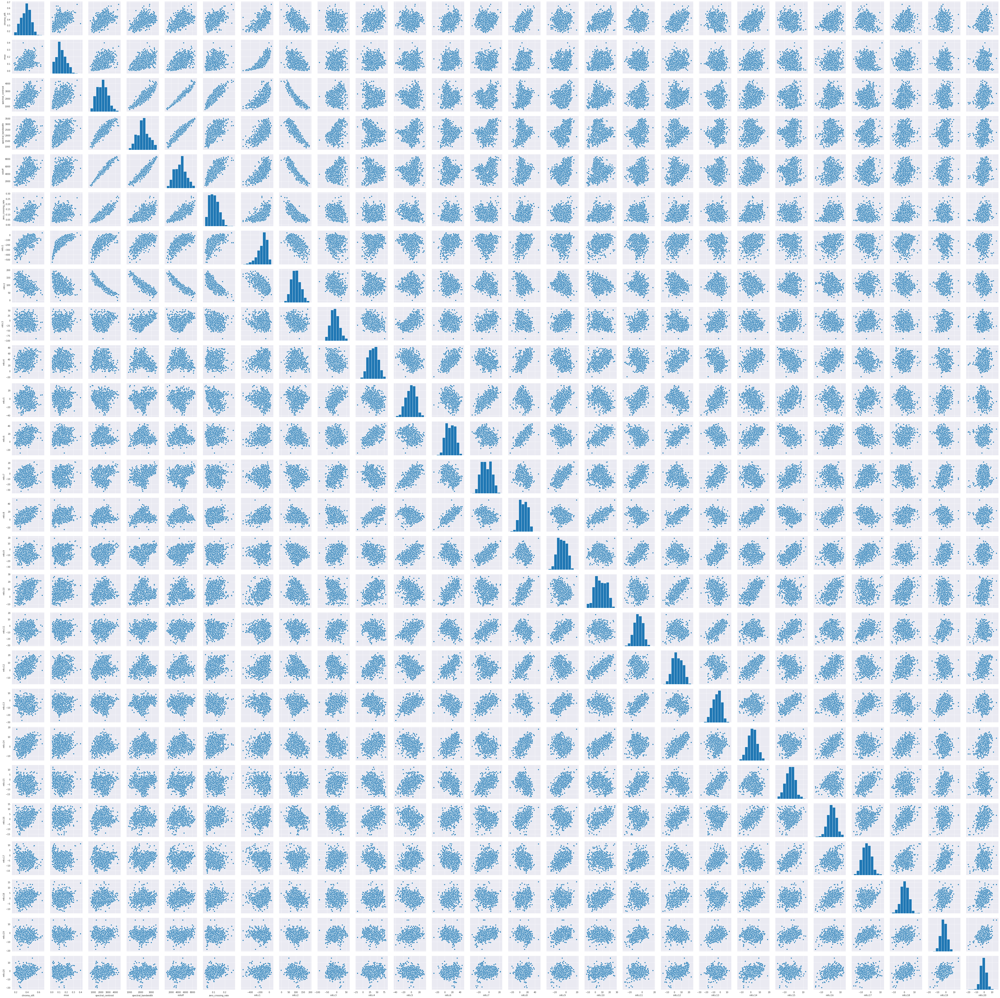

In [40]:
sns.pairplot(data)

In [41]:
# Dropping unneccesary columns
data = data.drop(['filename'],axis=1)
data.head()

,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label
0,0.390212,0.136276,2279.124558,2375.102120,5198.360233,0.092570,-109.509285,86.922406,-8.607986,64.494557,-6.304126,43.639515,-8.286753,28.546109,-14.079793,8.125040,-21.491401,11.087480,-5.085794,3.976359,-12.859741,12.343857,0.026217,-0.741570,-5.126619,3.303441,blues
1,0.278484,0.076970,1198.607665,1573.308974,2478.376680,0.051988,-284.819504,108.785628,9.131956,51.259030,18.111256,7.621317,8.781747,2.372426,0.011787,2.250417,4.200278,-3.303735,1.601561,2.660517,3.323455,3.258920,-4.551106,0.493845,5.937066,3.231544,blues
2,0.263016,0.170081,1379.081742,2004.000850,3015.831764,0.039376,-206.987590,117.781468,23.256245,28.294068,-1.099598,18.864939,-21.953711,17.855118,-25.583357,2.128552,-17.789054,-8.015467,-17.616342,-8.138554,-8.646157,-15.538988,-15.331506,-9.664872,-10.103310,-17.835100,blues
3,0.255321,0.085868,1151.340441,1709.193938,2312.577683,0.035339,-301.686274,111.539209,21.895657,16.145590,8.191590,22.085966,-8.613639,1.491924,-17.074520,-8.337533,-17.011287,-10.572882,-15.687018,-12.598773,-12.245661,-14.543065,-10.092300,-5.780286,-7.776049,-7.186643,blues
4,0.336773,0.158098,1442.190271,1870.534155,3083.414688,0.050889,-155.504931,125.638857,1.596554,45.804523,0.900779,25.367563,-10.787496,15.566380,-11.920468,1.264440,-6.649819,-0.792894,-7.748057,0.413548,-7.030262,3.997678,-6.256612,0.958226,2.019822,-5.742189,blues


Now, we’ll encode genres into integers

In [42]:
genre_list = data.iloc[:,-1] # selecting last columns to convert it into integers
encoder = LabelEncoder()
Y = encoder.fit_transform(genre_list)
print(Y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 

Normalizing the dataset

In [49]:
scaler = MinMaxScaler()
X1_data = np.array(data.iloc[:, :-1], dtype = float) # converting the scaler value into float number to maintain the precision
X1 = scaler.fit_transform(X_data)
print(X1)

[[0.44415154 0.33355842 0.44227972 ... 0.41067983 0.40304688 0.65824077]
 [0.21696673 0.18255224 0.16267965 ... 0.4558422  0.73637978 0.65620429]
 [0.18551358 0.41963471 0.20938005 ... 0.08447561 0.25310634 0.05948598]
 ...
 [0.3874958  0.20016533 0.21444942 ... 0.49475361 0.40556255 0.46310698]
 [0.40030174 0.25231556 0.52692804 ... 0.63856594 0.42566058 0.57353729]
 [0.38278873 0.28384386 0.40847198 ... 0.55878574 0.44602295 0.59546545]]


In [0]:
from sklearn.preprocessing import StandardScaler

In [0]:
scaler = StandardScaler()

In [43]:
# Normalizing the data my Standard Scaler, we can use Minmax scaler also
scaler = StandardScaler()
X = scaler.fit_transform(np.array(data.iloc[:,:-1],dtype=float)) # need to convert scaler value into float to maintain precision
print(X)

[[ 1.41346930e-01  8.14513634e-02  1.08007236e-01 ... -3.22943550e-01
  -7.45356062e-01  1.14669599e+00]
 [-1.22677249e+00 -8.21876057e-01 -1.40193120e+00 ... -3.47996008e-03
   2.20205489e+00  1.12795173e+00]
 [-1.41618510e+00  5.96364572e-01 -1.14973269e+00 ... -2.63040359e+00
  -2.07116694e+00 -4.36438703e+00]
 ...
 [-1.99837016e-01 -7.16513584e-01 -1.12235633e+00 ...  2.71766396e-01
  -7.23111849e-01 -6.49362280e-01]
 [-1.22718930e-01 -4.04547948e-01  5.65137871e-01 ...  1.28904691e+00
  -5.45400139e-01  3.67064777e-01]
 [-2.28183280e-01 -2.15943895e-01 -7.45664229e-02 ...  7.24708331e-01
  -3.65351138e-01  5.68896862e-01]]


In [0]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

In [51]:
input_shape = (X_train.shape[1],)
input_shape

(26,)

We’ll be using keras sequential model.

In [0]:
  model = Sequential()
  model.add(layers.Dense(256,activation='relu',input_shape=input_shape))
  model.add(Dropout(0.25))
  model.add(BatchNormalization())
  model.add(layers.Dense(128,activation='relu'))
  model.add(Dropout(0.25))
  model.add(BatchNormalization())
  model.add(layers.Dense(64,activation='relu'))
  model.add(Dropout(0.5))
  model.add(layers.Dense(10,activation='softmax'))

 Loss function sparse_categorical_crossentropy is similar to categorical_crossentropy just used when we have multiple classification fields.

In [54]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics = ['accuracy'])

In [55]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 256)               6912      
_________________________________________________________________
dropout_4 (Dropout)          (None, 256)               0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 256)               1024      
_________________________________________________________________
dense_5 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_5 (Dropout)          (None, 128)               0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 128)               512       
_________________________________________________________________
dense_6 (Dense)              (None, 64)               

In [0]:
from keras.callbacks import ModelCheckpoint
import os
outputFolder = './content/Model_output/'
if not os.path.exists(outputFolder):
    os.makedirs(outputFolder)
filepath = outputFolder+"/weights-{epoch:02d}-{val_acc:.4f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, 
                             save_best_only=False, save_weights_only=True, 
                             mode='auto', period=1)
# this will save the weights every 10 epoch

from keras.callbacks import EarlyStopping
earlystop = EarlyStopping(monitor='val_acc', min_delta=0.0001, patience=3,
                          verbose=1, mode='auto')

In [0]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.callbacks import ReduceLROnPlateau
class my_custom_callback(keras.callbacks.Callback):
    # There are multiple actions that you can take at various stages of modeling fitting process
    # I have added a auc score calcualtion at every epoch's end
    def on_train_begin(self, logs={}):
        self.aucs = []
        self.losses = []


    def on_epoch_end(self, epoch, logs={}):
        self.losses.append(logs.get('loss'))
        y_pred = self.model.predict(self.validation_data[0])
        self.aucs.append(roc_auc_score(self.validation_data[1], y_pred))
        print('auc score for validation data :',self.aucs[-1])
        return
mycallback=my_custom_callback()

In [60]:
model.fit(X_train,Y_train,epochs=500,batch_size=128,callbacks=[earlystop])

Epoch 1/100
800/800 [==============================] - 0s 80us/step - loss: 0.1185 - acc: 0.9637
Epoch 2/100
800/800 [==============================] - 0s 74us/step - loss: 0.1232 - acc: 0.9550
Epoch 3/100
800/800 [==============================] - 0s 73us/step - loss: 0.1196 - acc: 0.9575
Epoch 4/100
800/800 [==============================] - 0s 69us/step - loss: 0.1201 - acc: 0.9575
Epoch 5/100
128/800 [===>..........................] - ETA: 0s - loss: 0.1193 - acc: 0.9453

/usr/local/lib/python3.6/dist-packages/keras/callbacks.py:842: RuntimeWarning: Early stopping conditioned on metric `val_acc` which is not available. Available metrics are: loss,acc
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


800/800 [==============================] - 0s 80us/step - loss: 0.1136 - acc: 0.9688
Epoch 6/100
800/800 [==============================] - 0s 64us/step - loss: 0.1180 - acc: 0.9637
Epoch 7/100
800/800 [==============================] - 0s 61us/step - loss: 0.1193 - acc: 0.9637
Epoch 8/100
800/800 [==============================] - 0s 56us/step - loss: 0.0931 - acc: 0.9738
Epoch 9/100
800/800 [==============================] - 0s 56us/step - loss: 0.1095 - acc: 0.9662
Epoch 10/100
800/800 [==============================] - 0s 57us/step - loss: 0.1238 - acc: 0.9612
Epoch 11/100
800/800 [==============================] - 0s 58us/step - loss: 0.1290 - acc: 0.9600
Epoch 12/100
800/800 [==============================] - 0s 55us/step - loss: 0.1247 - acc: 0.9612
Epoch 13/100
800/800 [==============================] - 0s 62us/step - loss: 0.1256 - acc: 0.9587
Epoch 14/100
800/800 [==============================] - 0s 92us/step - loss: 0.0992 - acc: 0.9688
Epoch 15/100
800/800 [===============

In [61]:
loss_test, acc_test = model.evaluate(X_test, Y_test)
print('Accuracy on Test data: ', acc_test)
print('Loss on Test data:' ,loss_test )

200/200 [==============================] - 0s 569us/step
Accuracy on Test data:  0.705
Loss on Test data: 1.9060383129119873


In [62]:
prediction = model.predict(X_test)
print(prediction)

[[5.99014924e-13 1.76572171e-19 4.63895877e-20 ... 3.79776350e-21
  1.58055388e-22 6.61119857e-12]
 [2.17147841e-04 8.24345827e-01 3.47412024e-05 ... 8.42931627e-07
  7.96888116e-07 1.26006034e-06]
 [1.07082531e-04 4.29928804e-09 1.90364830e-07 ... 3.71128767e-10
  3.30263039e-11 1.69864378e-03]
 ...
 [2.40043810e-17 6.34706751e-13 6.07919043e-13 ... 1.00000000e+00
  1.34544145e-08 1.53019125e-10]
 [1.78634152e-02 7.19094425e-02 8.86676967e-01 ... 2.75612510e-05
  6.17566839e-05 2.62185677e-05]
 [1.67795617e-04 8.97914797e-05 1.73433162e-02 ... 2.73315614e-04
  9.46393469e-04 2.10516038e-04]]


In [63]:
submission_pred = pd.DataFrame(prediction,columns=['blues','classical','country','disco',
                                                    'hiphop','jazz','metal','pop','reggae','rock'])
submission_pred

,blues,classical,country,disco,hiphop,jazz,metal,pop,reggae,rock
0,5.990149e-13,1.765722e-19,4.638959e-20,1.024567e-14,2.816020e-10,1.528446e-22,1.000000e+00,3.797764e-21,1.580554e-22,6.611199e-12
1,2.171478e-04,8.243458e-01,3.474120e-05,6.450785e-06,3.207386e-06,1.753895e-01,1.739305e-07,8.429316e-07,7.968881e-07,1.260060e-06
2,1.070825e-04,4.299288e-09,1.903648e-07,6.722086e-07,7.720728e-06,2.699627e-09,9.981857e-01,3.711288e-10,3.302630e-11,1.698644e-03
3,9.890074e-01,1.638156e-12,7.164387e-13,1.155392e-10,2.911324e-09,4.547816e-13,3.790339e-03,6.715072e-17,2.917713e-12,7.202376e-03
4,7.982959e-13,1.473204e-14,1.500895e-09,1.017758e-11,1.104092e-08,2.882766e-10,4.292442e-14,5.217126e-07,9.999995e-01,4.016771e-10
...,...,...,...,...,...,...,...,...,...,...
195,5.159783e-08,2.221129e-09,3.344496e-08,9.999894e-01,6.031373e-08,7.638053e-08,8.209718e-08,3.100335e-08,1.963324e-07,1.021033e-05
196,8.415597e-03,3.197398e-05,1.270479e-04,1.413322e-02,2.358396e-03,4.769661e-04,8.252218e-04,2.612426e-04,1.640061e-02,9.569697e-01
197,2.400438e-17,6.347068e-13,6.079190e-13,3.648694e-10,1.115159e-08,1.171695e-11,9.377210e-13,1.000000e+00,1.345441e-08,1.530191e-10
198,1.786342e-02,7.190944e-02,8.866770e-01,2.733822e-05,1.285915e-04,2.326941e-02,9.369922e-06,2.756125e-05,6.175668e-05,2.621857e-05


In [0]:
submission_pred.to_csv('Project_2_Music_genre')